<a href="https://colab.research.google.com/github/maharab2893/Portfolio/blob/main/Cat_vs_Dog.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Downlaod Dataset

In [58]:
!wget https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip

--2026-08-30 10:27:39--  https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.222.206.35, 2600:1406:5e00:389::317f, 2600:1406:5e00:392::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.222.206.35|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip.1’

kagglecatsanddogs_5 100%[===================>] 786.67M   176MB/s    in 9.0s    

2026-08-30 10:27:48 (87.2 MB/s) - ‘kagglecatsanddogs_5340.zip.1’ saved [824887076/824887076]



##Unzip

In [59]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

Label Dog = 1 and Cat = 0

Import Modules

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from keras.preprocessing.image import load_img
import os
import tqdm
import random


##Create dataframe for Input and Output

In [61]:
input_Path = []
label=[]
for class_name in os.listdir('PetImages'):
  for path in tqdm.tqdm(os.listdir(f'PetImages/{class_name}')):
    if class_name=='Cat':
      label.append(0)
    else:
      label.append(1)
    input_Path.append(os.path.join('PetImages',class_name,path))
print(input_Path[10],label[10])

100%|██████████| 12501/12501 [00:00<00:00, 525044.00it/s]

PetImages/Dog/7218.jpg 1


In [62]:
df = pd.DataFrame()
df['images'] = input_Path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Dog/11003.jpg,1
1,PetImages/Cat/7278.jpg,0
2,PetImages/Cat/8725.jpg,0
3,PetImages/Dog/3397.jpg,1
4,PetImages/Dog/349.jpg,1


In [63]:
for i in df['images']:
  if '.jpg' not in i:
    print(i)

PetImages/Cat/Thumbs.db
PetImages/Dog/Thumbs.db


In [64]:
import PIL
l=[]
for image in df['images']:
  try:
    img = PIL.Image.open(image)
  except:
    l.append(image)
l

['PetImages/Cat/Thumbs.db',
 'PetImages/Dog/11702.jpg',
 'PetImages/Cat/666.jpg',
 'PetImages/Dog/Thumbs.db']

In [65]:
#delete db file
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Dog/11702.jpg']
df = df[df['images']!='PetImages/Cat/666.jpg']
len(df)

24998

## Exploratory Data Analysis

##Load Dog

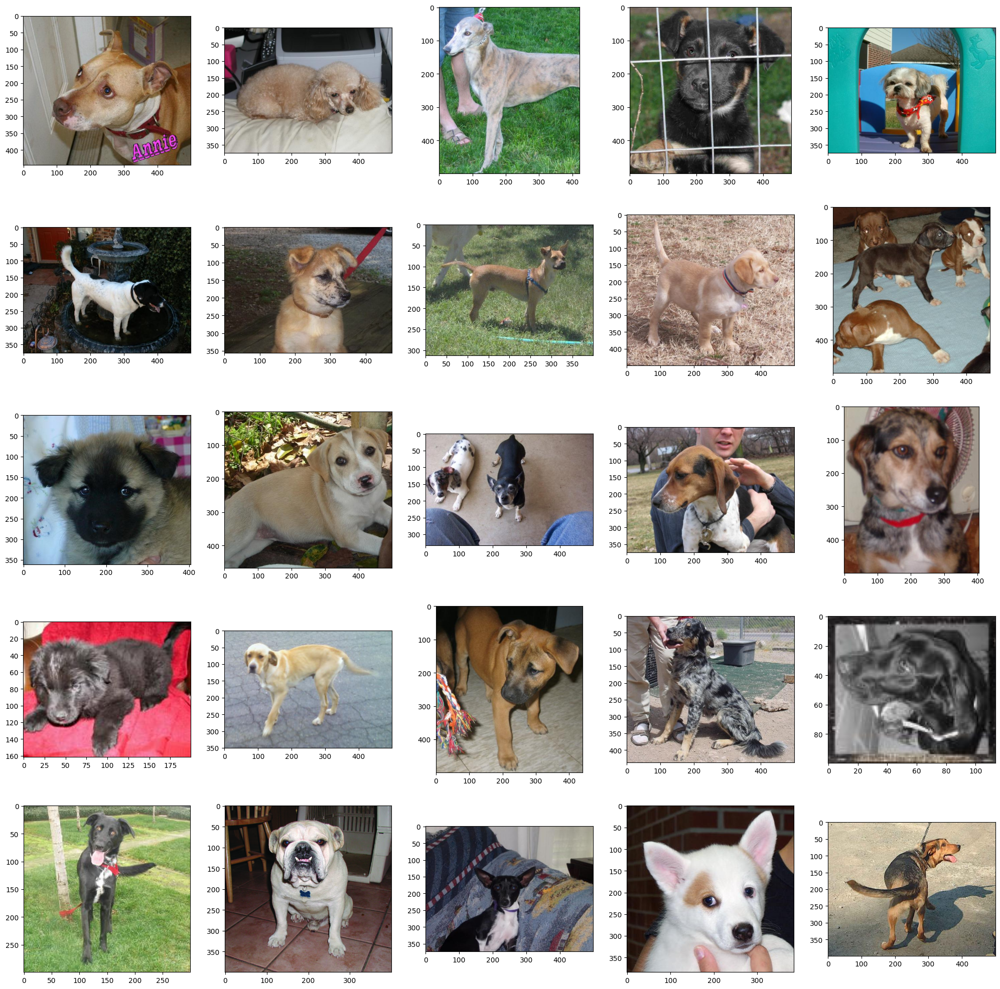

In [66]:
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0,len(temp))
files = temp[start:start+25]
for index,file in enumerate(files):
  plt.subplot(5,5,index+1)
  img = load_img(file)
  plt.imshow(img)

##Load Cat

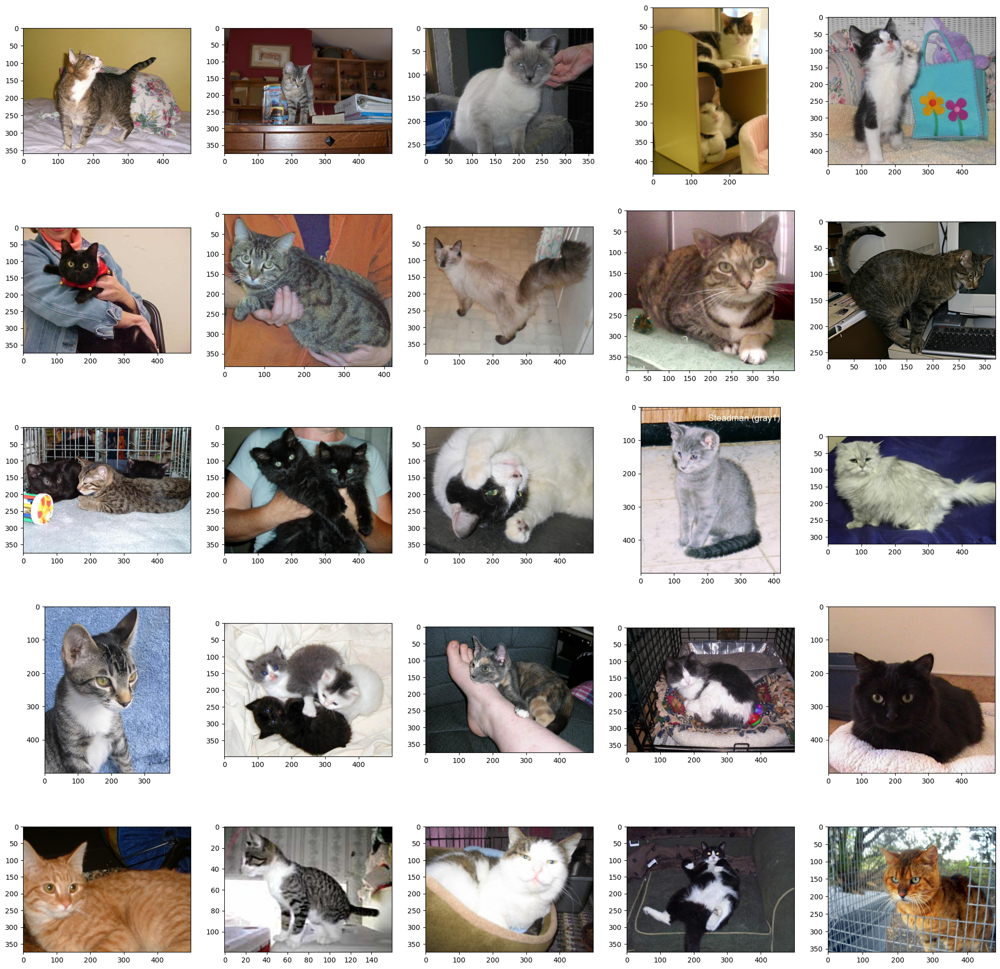

In [67]:
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0,len(temp))
files = temp[start:start+25]
for index,file in enumerate(files):
  plt.subplot(5,5,index+1)
  img = load_img(file)
  plt.imshow(img)

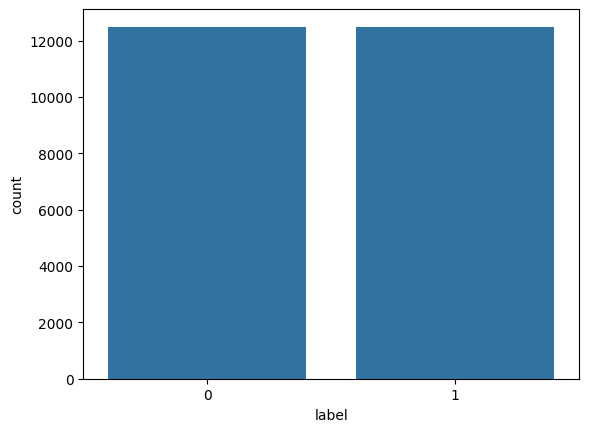

In [68]:
import seaborn as sns
sns.countplot(x=df['label'])
plt.show()

##create Data Generator for the Images

In [69]:
df['label']=df['label'].astype('str')

In [70]:
df.head()

,images,label
0,PetImages/Dog/11003.jpg,1
1,PetImages/Cat/7278.jpg,0
2,PetImages/Cat/8725.jpg,0
3,PetImages/Dog/3397.jpg,1
4,PetImages/Dog/349.jpg,1


In [71]:
from sklearn.model_selection import train_test_split
train,test = train_test_split(df,test_size=0.2,random_state=42)

In [72]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1/255,
    rotation_range = 40,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest',
)
val_generator = ImageDataGenerator(rescale=1/255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)
val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


Model Creation

In [73]:
from keras import Sequential
from keras.layers import Conv2D,MaxPool2D,Flatten,Dense,Dropout

model = Sequential([
    Conv2D(16,(3,3),activation='relu',input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(64,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512,activation='relu'),
    Dense(1,activation='sigmoid')
])


In [74]:
model.compile(optimizer='adam',loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [78]:
history = model.fit(train_iterator, epochs=30, validation_data=val_iterator)

Epoch 1/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 115s 3s/step - accuracy: 0.7905 - loss: 0.4464 - val_accuracy: 0.8066 - val_loss: 0.4160
Epoch 2/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 114s 3s/step - accuracy: 0.8015 - loss: 0.4329 - val_accuracy: 0.8214 - val_loss: 0.4019
Epoch 3/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 114s 3s/step - accuracy: 0.7998 - loss: 0.4286 - val_accuracy: 0.8184 - val_loss: 0.4038
Epoch 4/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 116s 3s/step - accuracy: 0.7922 - loss: 0.4429 - val_accuracy: 0.8094 - val_loss: 0.4170
Epoch 5/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 114s 3s/step - accuracy: 0.8088 - loss: 0.4157 - val_accuracy: 0.8092 - val_loss: 0.4146
Epoch 6/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - accuracy: 0.8101 - loss: 0.4145 - val_accuracy: 0.8222 - val_loss: 0.3925
Epoch 7/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 114s 3s/step - accuracy: 0.8134 - loss: 0.4057 - val_accuracy: 0.7884 - val_loss: 0.4564
Epoch 8/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 114s 3s/step - accuracy: 0.8152 - loss: 0.4061 - val_accuracy: 0.8086 - v

Visualization of Results

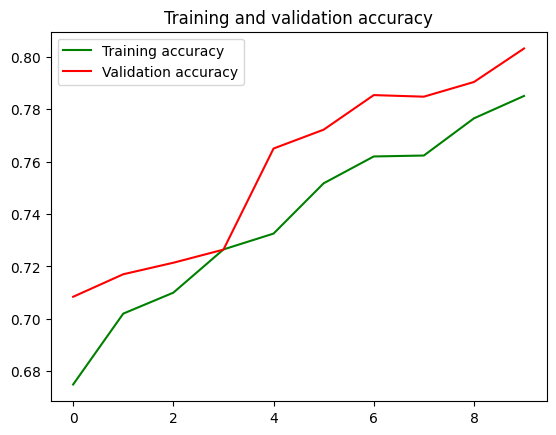

<Figure size 640x480 with 0 Axes>

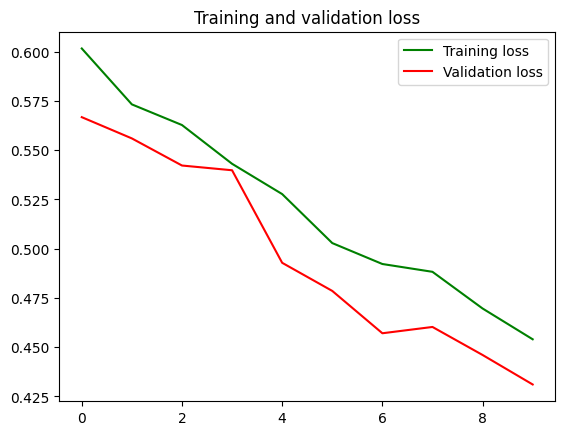

In [77]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'g', label='Training accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()
plt.show()

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochs, loss, 'g', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure
plt.show()